# Nitel Sonuçlar

Fold 0 test setinde 18 kontrol noktasının aynı 200 aday epizot üzerindeki nitel karşılaştırmaları. Kolay / Orta / Zor örnek seçimi için ResNet-50 dondurulmuş referans alınır.

**Ne üretir:**
- **Article kahraman görselleri** (`figures/qualitative_results/`): `qualitative_backbone.{pdf,png}` ve `qualitative_unfreeze.{pdf,png}`
- **Tez görselleri** (`figures/qualitative_results/`): 4 deney × 3 zorluk = 12 PNG

**Bağımlılıklar:** GPU + 18 checkpoint (`experiments/checkpoints/`) + `data/processed/tiles/`. Ağır — ~15-20 dk sürer.

**Ön koşul:** Training dinamiği notebook'unu çalıştırma gerekli değil, bağımsızdır.


### 2.1 Kurulum — GPU, Dataset, Yardımcılar

In [6]:
import sys
import warnings
import random
from pathlib import Path

import numpy as np
import torch
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

PROJECT_ROOT = Path.cwd().parent
sys.path.insert(0, str(PROJECT_ROOT))

from src.config import cfg
from src.model import ProtoNet
from src.dataset import WoodlandFewShotDataset, get_val_transform

%matplotlib inline
plt.rcParams["figure.dpi"] = 150

FOLD = 0
SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

FIGURES_ARTICLE = PROJECT_ROOT / "figures" / "qualitative_results"
FIGURES_THESIS = PROJECT_ROOT / "figures" / "qualitative_results"
FIGURES_ARTICLE.mkdir(parents=True, exist_ok=True)
FIGURES_THESIS.mkdir(parents=True, exist_ok=True)

CKPT_DIR = PROJECT_ROOT / "experiments" / "checkpoints"

print(f"Cihaz: {DEVICE}")
print(f"Kontrol noktaları: {CKPT_DIR}")


Cihaz: cpu
Kontrol noktaları: /home/zehra/Desktop/woodland/experiments/checkpoints


In [7]:
# ── Yardımcı fonksiyonlar ──
def load_model(ckpt_filename):
    ckpt_path = CKPT_DIR / ckpt_filename
    if not ckpt_path.exists():
        raise FileNotFoundError(f"Bulunamadı: {ckpt_path}")
    checkpoint = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    saved_cfg = checkpoint.get("config", {})
    model = ProtoNet(
        backbone_name=saved_cfg.get("BACKBONE", "resnet50"),
        feature_dim=saved_cfg.get("FEATURE_DIM", 256),
        unfreeze_from=saved_cfg.get("UNFREEZE_FROM", "none"),
        input_size=saved_cfg.get("INPUT_SIZE", 473),
        pretrained=saved_cfg.get("PRETRAINED", "imagenet_v1"),
        pretrained_ckpt_dir=str(PROJECT_ROOT / "experiments" / "pretrained_weights"),
    ).to(DEVICE)

    state_dict = checkpoint["model_state_dict"]

    # Eski Swin-T anahtarlarını yeniden eşle (swin_features.X → swin_stem/stage3/stage4)
    if any(k.startswith("swin_features.") for k in state_dict):
        stage_map = {
            "0": ("swin_stem", "0"), "1": ("swin_stem", "1"),
            "2": ("swin_stem", "2"), "3": ("swin_stem", "3"),
            "4": ("swin_stage3", "0"), "5": ("swin_stage3", "1"),
            "6": ("swin_stage4", "0"), "7": ("swin_stage4", "1"),
        }
        new_sd = {}
        for k, v in state_dict.items():
            if k.startswith("swin_features."):
                parts = k.split(".", 2)
                idx = parts[1]
                rest = parts[2] if len(parts) > 2 else ""
                new_prefix, new_idx = stage_map[idx]
                new_k = f"{new_prefix}.{new_idx}.{rest}" if rest else f"{new_prefix}.{new_idx}"
                new_sd[new_k] = v
            else:
                new_sd[k] = v
        state_dict = new_sd

    model.load_state_dict(state_dict)
    model.eval()
    return model


def compute_iou(pred, target):
    inter = (pred & target).sum().item()
    union = (pred | target).sum().item()
    return inter / union if union > 0 else 0.0


def denormalize(tensor):
    mean = torch.tensor(cfg.IMAGENET_MEAN).view(3, 1, 1)
    std = torch.tensor(cfg.IMAGENET_STD).view(3, 1, 1)
    return (tensor.cpu() * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()


@torch.no_grad()
def predict_episode(model, ep):
    s_img = ep["support_images"].unsqueeze(0).to(DEVICE)
    s_msk = ep["support_masks"].unsqueeze(0).to(DEVICE)
    q_img = ep["query_image"].unsqueeze(0).to(DEVICE)
    logits = model(s_img, s_msk, q_img)
    return (logits.squeeze(0).squeeze(0) > 0).cpu()


# Yeşil = TP (doğru ağaçlık), Kırmızı = FP (yanlış ağaçlık), Mavi = FN (kaçırılan ağaçlık)
COLOR_TP = np.array([0.0, 0.5, 0.0])
COLOR_FP = np.array([0.9, 0.0, 0.0])
COLOR_FN = np.array([0.0, 0.0, 0.9])
ALPHA = 0.45


def make_overlay(img, gt, pred):
    o = img.copy()
    o[gt & pred]    = o[gt & pred]    * (1 - ALPHA) + COLOR_TP * ALPHA
    o[(~gt) & pred] = o[(~gt) & pred] * (1 - ALPHA) + COLOR_FP * ALPHA
    o[gt & (~pred)] = o[gt & (~pred)] * (1 - ALPHA) + COLOR_FN * ALPHA
    return np.clip(o, 0, 1)


def make_gt_overlay(img, gt):
    o = img.copy()
    o[gt] = o[gt] * (1 - ALPHA) + COLOR_TP * ALPHA
    return np.clip(o, 0, 1)


def get_fg_ratio(ep):
    m = ep["query_mask"]
    return m.sum().item() / m.numel()



### 2.2 18 Kontrol Noktasını Yükle

In [8]:
# 18 kontrol noktası, deneylere göre gruplu
ALL_CKPTS = {
    # Deney 1: Omurga karşılaştırması (8)
    "ResNet-18":   "best_ProtoNet_ResNet18_none_fold0_seed-42.pt",
    #"ResNet-34":   "best_ProtoNet_ResNet34_none_fold0_seed-42.pt",
    "ResNet-50":   "best_ProtoNet_ResNet50_none_fold0_seed-42.pt",
    #"ResNet-101":  "best_ProtoNet_ResNet101_none_fold0_seed-42.pt",
    #"ResNet-152":  "best_ProtoNet_ResNet152_none_fold0_seed-42.pt",
    #"Xception":    "best_ProtoNet_Xception_none_fold0_seed-42.pt",
    "Swin-T":      "best_ProtoNet_SwinT_none_fold0_seed-42.pt",
    #"ViT-B/16":    "best_ProtoNet_ViTB16_none_fold0_seed-42.pt",
    # Deney 2: Katman açma (4 ek)
    "R18-layer4":  "best_ProtoNet_ResNet18_layer4_fold0_seed-42.pt",
    "R18-layer3":  "best_ProtoNet_ResNet18_layer3_fold0_seed-42.pt",
    "R50-layer4":  "best_ProtoNet_ResNet50_layer4_fold0_seed-42.pt",
    "R50-layer3":  "best_ProtoNet_ResNet50_layer3_fold0_seed-42.pt",
    # Deney 3: Aşama açma (2 ek)
    #"Swin-T stage4": "best_ProtoNet_SwinT_ImageNetV1_stage4_fold0_seed-42.pt",
    #"Swin-T stage3": "best_ProtoNet_SwinT_ImageNetV1_stage3_fold0_seed-42.pt",
    # Deney 4: Ön eğitimli (4 ek)
    #"Million-AID": "best_ProtoNet_ResNet50_MillionAID_none_fold0_seed-42.pt",
    #"BigEarthNet": "best_ProtoNet_ResNet50_BigEarthNet_none_fold0_seed-42.pt",
    #"SeCo":        "best_ProtoNet_ResNet50_SeCo_none_fold0_seed-42.pt",
    #"Cityscapes":  "best_ProtoNet_ResNet50_Cityscapes_none_fold0_seed-42.pt",
}

models = {}
for label, ckpt in ALL_CKPTS.items():
    try:
        models[label] = load_model(ckpt)
        print(f"  ✓ {label}")
    except Exception as e:
        print(f"  ✗ {label} — {e}")

print(f"\n{len(models)}/{len(ALL_CKPTS)} model yüklendi.")



[MODEL] ProtoNet — backbone=resnet18, pretrained=imagenet_v1, unfreeze=none
  Eğitilebilir:      131,585 parametre
  Frozen:         11,176,512 parametre
  Toplam:         11,308,097 parametre
  ✓ ResNet-18

[MODEL] ProtoNet — backbone=resnet50, pretrained=imagenet_v1, unfreeze=none
  Eğitilebilir:      524,801 parametre
  Frozen:         23,508,032 parametre
  Toplam:         24,032,833 parametre
  ✓ ResNet-50

[MODEL] ProtoNet — backbone=swin_t, pretrained=imagenet_v1, unfreeze=none
  Eğitilebilir:      197,121 parametre
  Frozen:         27,519,354 parametre
  Toplam:         27,716,475 parametre
  ✓ Swin-T

[MODEL] ProtoNet — backbone=resnet18, pretrained=imagenet_v1, unfreeze=layer4
  Eğitilebilir:    8,525,313 parametre
  Frozen:          2,782,784 parametre
  Toplam:         11,308,097 parametre
  ✓ R18-layer4

[MODEL] ProtoNet — backbone=resnet18, pretrained=imagenet_v1, unfreeze=layer3
  Eğitilebilir:   10,625,025 parametre
  Frozen:            683,072 parametre
  Toplam:    

### 2.3 Epizotları Topla & fgIoU Hesapla

In [9]:
N_CANDIDATES = 200

dataset = WoodlandFewShotDataset(
    split="test", fold_i=FOLD, k_shot=cfg.K_SUPPORT,
    episodes_per_epoch=N_CANDIDATES, transform=get_val_transform(), seed=SEED,
)

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
episodes = [dataset[i] for i in range(N_CANDIDATES)]
print(f"{len(episodes)} epizot toplandı.")



[DATASET] test/fold0 — NOVEL (woodland) — k=5
  Images (9): ['M-34-51-C-b-2-1', 'M-34-51-C-d-4-1', 'M-34-56-A-b-1-4', 'M-34-65-D-d-4-1', 'M-34-68-B-a-1-3', 'N-33-104-A-c-1-1', 'N-33-119-C-c-3-3', 'N-34-106-A-c-1-3', 'N-34-97-D-c-2-4']
  Woodland      : 1252 tile, 9 images
200 epizot toplandı.


In [10]:
# Her model × her epizot için fgIoU
all_ious = {}
for label, model in models.items():
    ious = []
    for ep in episodes:
        pred = predict_episode(model, ep)
        gt = ep["query_mask"].bool()
        ious.append(compute_iou(pred, gt))
    all_ious[label] = np.array(ious)
    print(f"  {label}: medyan fgIoU = {np.median(ious):.3f}")

ref_ious = all_ious["ResNet-50"]
print(f"\nReferans (ResNet-50 frozen) medyan fgIoU: {np.median(ref_ious):.3f}")


  ResNet-18: medyan fgIoU = 0.359
  ResNet-50: medyan fgIoU = 0.353
  Swin-T: medyan fgIoU = 0.365
  R18-layer4: medyan fgIoU = 0.356
  R18-layer3: medyan fgIoU = 0.412
  R50-layer4: medyan fgIoU = 0.360
  R50-layer3: medyan fgIoU = 0.353

Referans (ResNet-50 frozen) medyan fgIoU: 0.353


### 2.4 Kolay / Orta / Zor Örnek Seçimi

Seçim kriterleri (tüm figürler için aynı 3 epizot):
- Referans: ResNet-50 dondurulmuş fgIoU
- $\Delta_{\text{layer3}}$ ve $\Delta_{\text{SeCo}}$ her ikisi $\in [-0.03, +0.10]$
- FG oranı $\geq \%15$
- Kolay: $\text{fgIoU} \in [0.80, 1.0]$ · Orta: $[0.40, 0.60]$ · Zor: $[0.15, 0.35]$

In [17]:
frozen_ious = all_ious["ResNet-50"]
layer3_ious = all_ious["R50-layer3"]
#seco_ious = all_ious["SeCo"]

DELTA_MIN, DELTA_MAX = -0.03, 0.10
MIN_FG = 0.15


def find_candidates(iou_min, iou_max):
    cands = []
    for i in range(len(frozen_ious)):
        d_l3 = layer3_ious[i] - frozen_ious[i]
        #d_sc = seco_ious[i] - frozen_ious[i]
        fg = get_fg_ratio(episodes[i])
        if (iou_min <= frozen_ious[i] <= iou_max
                and DELTA_MIN <= d_l3 <= DELTA_MAX
                #and DELTA_MIN <= d_sc <= DELTA_MAX
                and fg >= MIN_FG):
            cands.append(i)
    return cands


easy_cands = find_candidates(0.80, 1.0)
mid_cands  = find_candidates(0.40, 0.60)
hard_cands = find_candidates(0.15, 0.35)

print(f"Kolay (0.80-1.0): {len(easy_cands)} aday")
print(f"Orta  (0.40-0.60): {len(mid_cands)} aday")
print(f"Zor   (0.15-0.35): {len(hard_cands)} aday")

auto_easy = easy_cands[len(easy_cands)//2] if easy_cands else None
auto_mid  = mid_cands[len(mid_cands)//2] if mid_cands else None
auto_hard = hard_cands[len(hard_cands)//2] if hard_cands else None

for name, idx in [("Kolay", auto_easy), ("Orta", auto_mid), ("Zor", auto_hard)]:
    if idx is not None:
        d_l3 = layer3_ious[idx] - frozen_ious[idx]
        #d_sc = seco_ious[idx] - frozen_ious[idx]
        fg = get_fg_ratio(episodes[idx])
        print(f"  {name} → ep={idx}  frozen={frozen_ious[idx]:.3f}  "
              #f"Δlayer3={d_l3:+.3f}  Δseco={d_sc:+.3f}  fg={fg:.0%}"
        )
    else:
        print(f"  {name} → BULUNAMADI")

# ─── Seçim (gerekirse elle değiştir) ───
selected = [auto_easy, auto_mid, auto_hard]
row_labels = ["Kolay örnek", "Orta örnek", "Zor örnek"]


Kolay (0.80-1.0): 7 aday
Orta  (0.40-0.60): 12 aday
Zor   (0.15-0.35): 21 aday
  Kolay → ep=100  frozen=0.926  
  Orta → ep=108  frozen=0.572  
  Zor → ep=79  frozen=0.212  


---

### 2.5 Makale Görselleri (Öne Çıkanlar)

Her satır: Sorgu Görüntüsü | Gerçek Etiket | Model1 | Model2 | Model3. Her görsel için 3 satır (Kolay / Orta / Zor)

In [18]:
def generate_article_figure(model_keys, display_labels=None):
    if display_labels is None:
        display_labels = model_keys

    n_rows = len(selected)
    n_cols = 2 + len(model_keys)
    # Alt legend için ek dikey alan
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(n_cols * 2.8, n_rows * 2.8 + 0.5))
    if n_rows == 1:
        axes = axes[np.newaxis, :]

    for row, (ep_idx, label) in enumerate(zip(selected, row_labels)):
        ep = episodes[ep_idx]
        img = denormalize(ep["query_image"])
        gt = ep["query_mask"].bool().numpy()

        axes[row, 0].imshow(img)
        axes[row, 0].set_ylabel(label, fontsize=10, fontweight="bold",
                                rotation=90, labelpad=10, va="center")
        axes[row, 1].imshow(make_gt_overlay(img, gt))

        for col, mk in enumerate(model_keys):
            pred = predict_episode(models[mk], ep).numpy()
            iou = compute_iou(pred, gt)
            axes[row, 2 + col].imshow(make_overlay(img, gt, pred))
            axes[row, 2 + col].set_xlabel(
                f"fgIoU={iou:.2f}".replace(".", ","), fontsize=8
            )

    titles = ["Sorgu Görüntüsü", "Gerçek Etiket"] + display_labels
    for col, t in enumerate(titles):
        axes[0, col].set_title(t, fontsize=9, fontweight="bold")

    for ax in axes.ravel():
        ax.set_xticks([]); ax.set_yticks([])

    # Alt legend: TP / FP / FN (italik, yatay, 3 sütun)
    from matplotlib.patches import Patch
    legend_handles = [
        Patch(facecolor=COLOR_TP, edgecolor="#2c3e50", label=r"$\it{TP}$"),
        Patch(facecolor=COLOR_FP, edgecolor="#2c3e50", label=r"$\it{FP}$"),
        Patch(facecolor=COLOR_FN, edgecolor="#2c3e50", label=r"$\it{FN}$"),
    ]
    fig.legend(handles=legend_handles, loc="lower center",
               bbox_to_anchor=(0.5, 0.02), ncol=3, frameon=False,
               fontsize=11, handletextpad=0.8, columnspacing=2.5)

    plt.tight_layout()
    return fig


#### Makale Görsel 1: Omurga Karşılaştırması

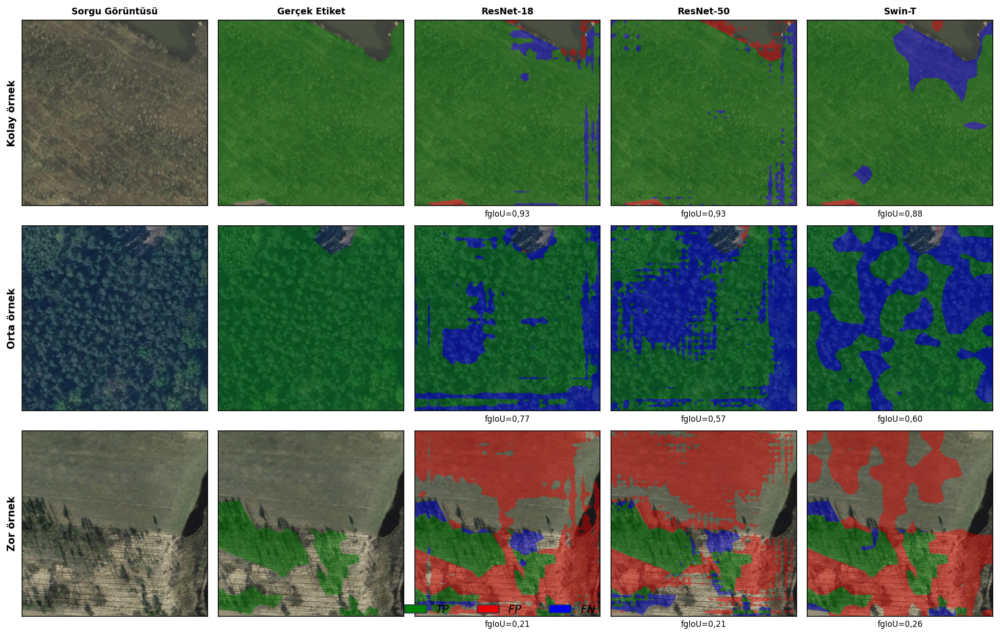

In [19]:
article_fig1 = generate_article_figure(
    model_keys=["ResNet-18", "ResNet-50", "Swin-T"],
)
plt.show()


#### Makale Görsel 2: Katman Açma Etkisi

In [2]:
article_fig2 = generate_article_figure(
    model_keys=["ResNet-50", "R50-layer4", "R50-layer3"],
    display_labels=["ResNet-50 (dondurulmuş)", "ResNet-50 (katman 4)", "ResNet-50 (katman 3)"],
)
plt.show()


NameError: name 'selected' is not defined

#### Makale Görsellerini Kaydet

In [25]:
for fig, name in [(article_fig1, "qualitative_backbone"),
                  (article_fig2, "qualitative_unfreeze")]:
    for ext in (".pdf", ".png"):
        path = FIGURES_ARTICLE / f"{name}{ext}"
        fig.savefig(path, dpi=300, bbox_inches="tight")
        print(f"Kaydedildi: {path}")


Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/qualitative_backbone.pdf
Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/qualitative_backbone.png
Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/qualitative_unfreeze.pdf
Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/qualitative_unfreeze.png


---

### 2.6 Tez Görselleri (Grid Düzen, Zorluk Başına Ayrı Dosya)

Her deney için 3 ayrı figür (Kolay / Orta / Zor örnek). Üst satırda Sorgu Görüntüsü + Gerçek Etiket ortada, alt satırlarda tüm değişken modeller grid halinde.

In [35]:
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch


def generate_thesis_single(ep_idx, difficulty_label, model_keys, display_labels,
                           cols, save_name, model_row_labels=None):
    """Tek örnek için tez figürü.
    PNG genişliği min 4 col standardına ayarlanır (Exp 1 referansı).
    Her satır kendi içinde ortalanır (kısmi son satırlar için)."""
    ep = episodes[ep_idx]
    img = denormalize(ep["query_image"])
    gt = ep["query_mask"].bool().numpy()

    n_models = len(model_keys)
    model_rows = int(np.ceil(n_models / cols))
    total_rows = 1 + model_rows

    fig_width_cols = max(cols, 4)
    scaled_cols = 2 * fig_width_cols

    extra_bottom = 0.5
    fig = plt.figure(figsize=(fig_width_cols * 2.6, total_rows * 2.6 + extra_bottom))
    gs = GridSpec(total_rows, scaled_cols, figure=fig, hspace=0.25, wspace=0.1)

    mid = scaled_cols // 2
    ax_query = fig.add_subplot(gs[0, mid - 2 : mid])
    ax_gt = fig.add_subplot(gs[0, mid : mid + 2])

    ax_query.imshow(img)
    ax_query.set_title("Sorgu Görüntüsü", fontsize=10, fontweight="bold")
    ax_gt.imshow(make_gt_overlay(img, gt))
    ax_gt.set_title("Gerçek Etiket", fontsize=10, fontweight="bold")
    for ax in [ax_query, ax_gt]:
        ax.set_xticks([]); ax.set_yticks([])

    # Model alt görselleri — her satır KENDİ içinde ortalanır
    first_ax_per_model_row = {}
    for col_idx, (mk, disp) in enumerate(zip(model_keys, display_labels)):
        model_row = col_idx // cols
        # Bu satırdaki kaç model var? (son satır kısmi olabilir)
        row_start_idx = model_row * cols
        row_end_idx = min(row_start_idx + cols, n_models)
        n_in_row = row_end_idx - row_start_idx
        # Bu satırı ortalamak için offset
        row_col_offset = (scaled_cols - 2 * n_in_row) // 2

        col_in_row = col_idx % cols
        col_start = row_col_offset + col_in_row * 2
        actual_row = 1 + model_row
        ax = fig.add_subplot(gs[actual_row, col_start : col_start + 2])

        pred = predict_episode(models[mk], ep).numpy()
        iou = compute_iou(pred, gt)
        ax.imshow(make_overlay(img, gt, pred))
        ax.set_title(disp, fontsize=9, fontweight="bold")
        ax.set_xlabel(f"fgIoU={iou:.2f}".replace(".", ","), fontsize=8)
        ax.set_xticks([]); ax.set_yticks([])

        if col_in_row == 0:
            first_ax_per_model_row[model_row] = ax

    # Satır etiketleri (Exp 2 için)
    if model_row_labels:
        for model_row_idx, label_text in model_row_labels:
            ax = first_ax_per_model_row.get(model_row_idx)
            if ax is not None:
                ax.set_ylabel(label_text, fontsize=12, fontweight="bold",
                              rotation=90, labelpad=10)

    # Alt legend: TP / FP / FN
    legend_handles = [
        Patch(facecolor=COLOR_TP, edgecolor="#2c3e50", label=r"$\it{TP}$"),
        Patch(facecolor=COLOR_FP, edgecolor="#2c3e50", label=r"$\it{FP}$"),
        Patch(facecolor=COLOR_FN, edgecolor="#2c3e50", label=r"$\it{FN}$"),
    ]
    fig.legend(handles=legend_handles, loc="lower center",
               bbox_to_anchor=(0.5, 0.02), ncol=3, frameon=False,
               fontsize=11, handletextpad=0.8, columnspacing=2.5)

    path = FIGURES_THESIS / f"{save_name}.png"
    fig.savefig(path, dpi=300, bbox_inches="tight")
    print(f"Kaydedildi: {path}")
    plt.show()
    return fig


def generate_thesis_experiment(model_keys, cols, save_name,
                               display_labels=None, model_row_labels=None):
    """Bir deney için 3 zorluk seviyesinde 3 ayrı figür üretir."""
    if display_labels is None:
        display_labels = model_keys
    difficulty_map = {"Kolay örnek": "kolay", "Orta örnek": "orta", "Zor örnek": "zor"}
    for ep_idx, label in zip(selected, row_labels):
        suffix = difficulty_map[label]
        generate_thesis_single(
            ep_idx=ep_idx, difficulty_label=label,
            model_keys=model_keys, display_labels=display_labels,
            cols=cols, save_name=f"{save_name}_{suffix}",
            model_row_labels=model_row_labels,
        )


#### Tez Görsel 1 — Omurga Karşılaştırması (8 model)

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp1_backbone_kolay.png


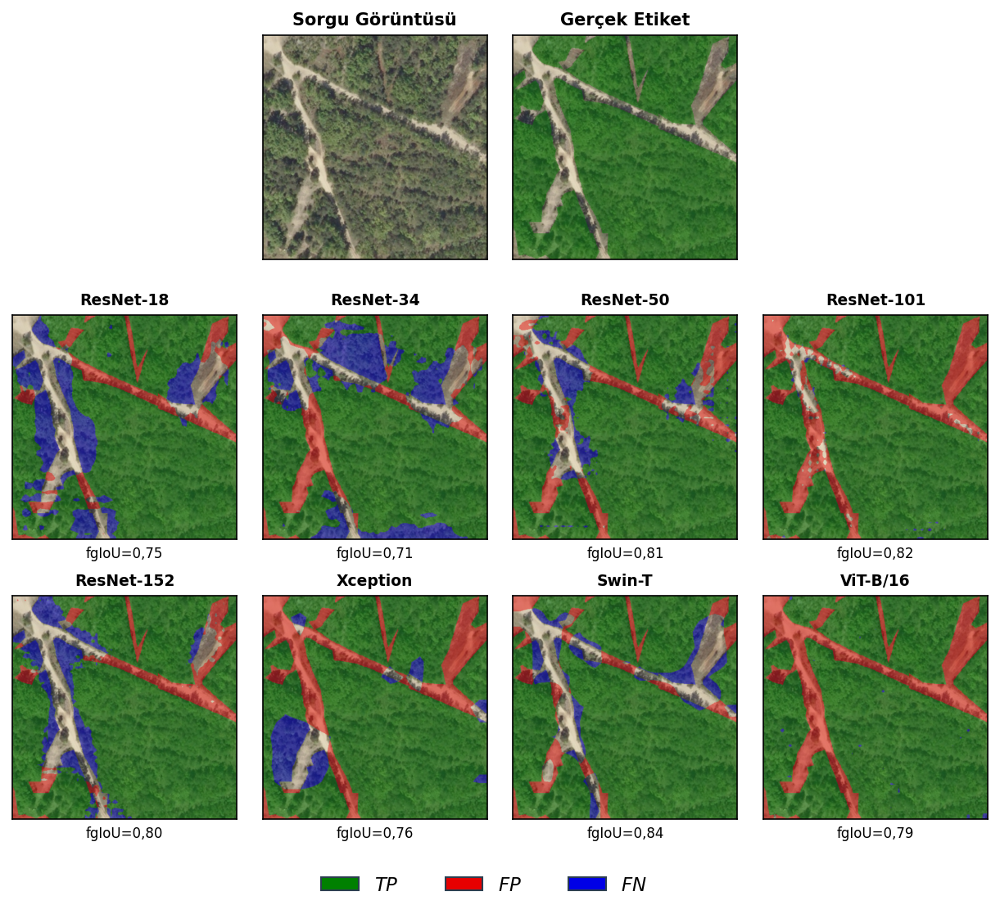

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp1_backbone_orta.png


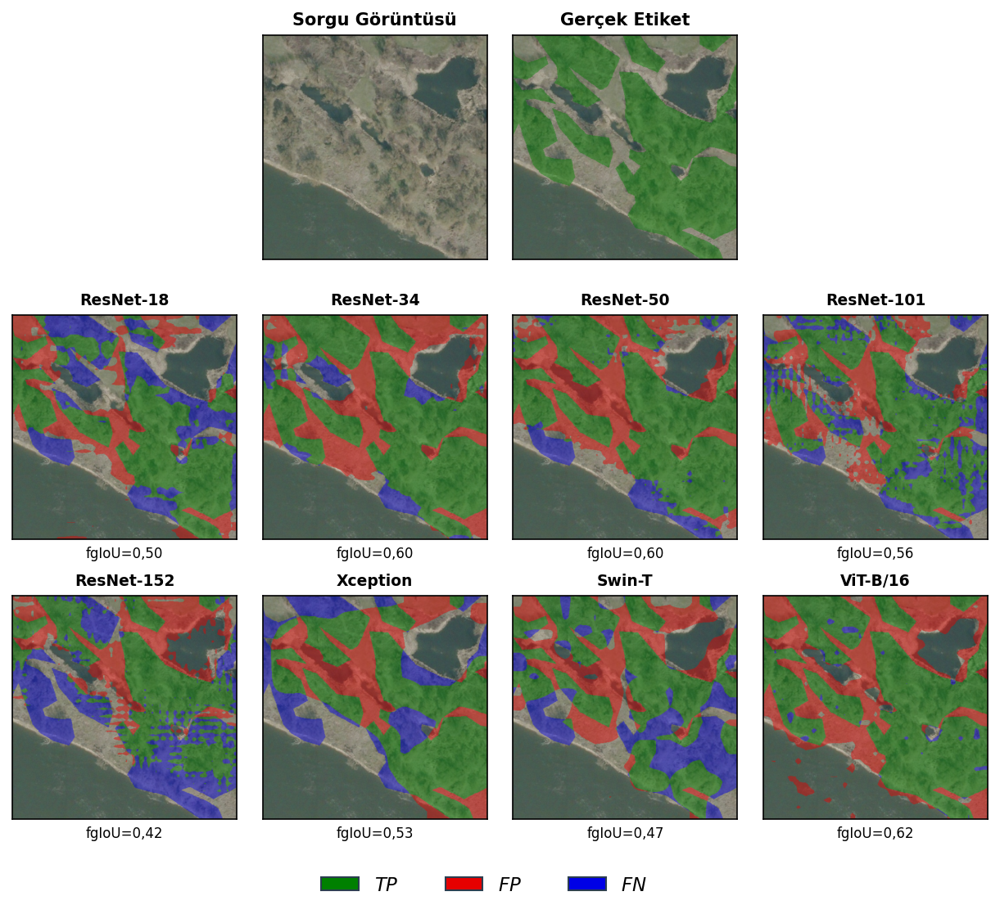

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp1_backbone_zor.png


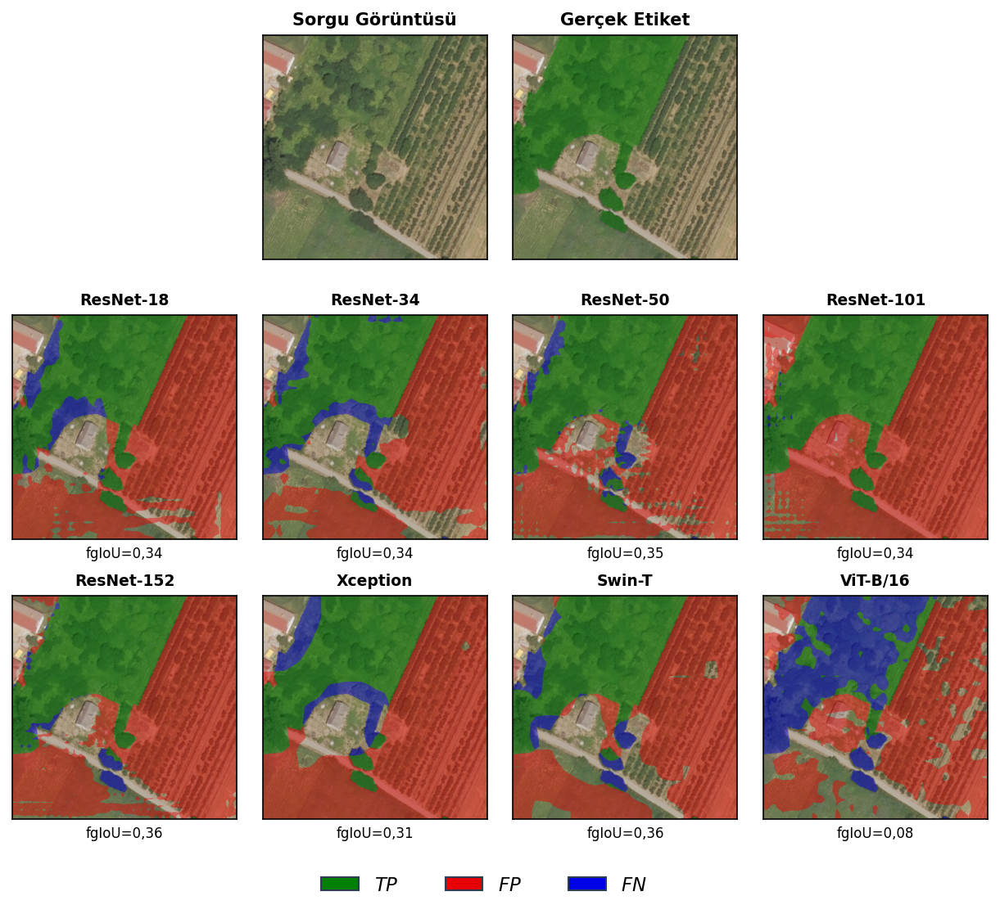

In [32]:
generate_thesis_experiment(
    model_keys=["ResNet-18", "ResNet-34", "ResNet-50", "ResNet-101",
                "ResNet-152", "Xception", "Swin-T", "ViT-B/16"],
    cols=4,
    save_name="exp1_backbone",
)


#### Tez Görsel 2 — Katman Açma (ResNet-18 + ResNet-50)

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp2_layer_unfreeze_kolay.png


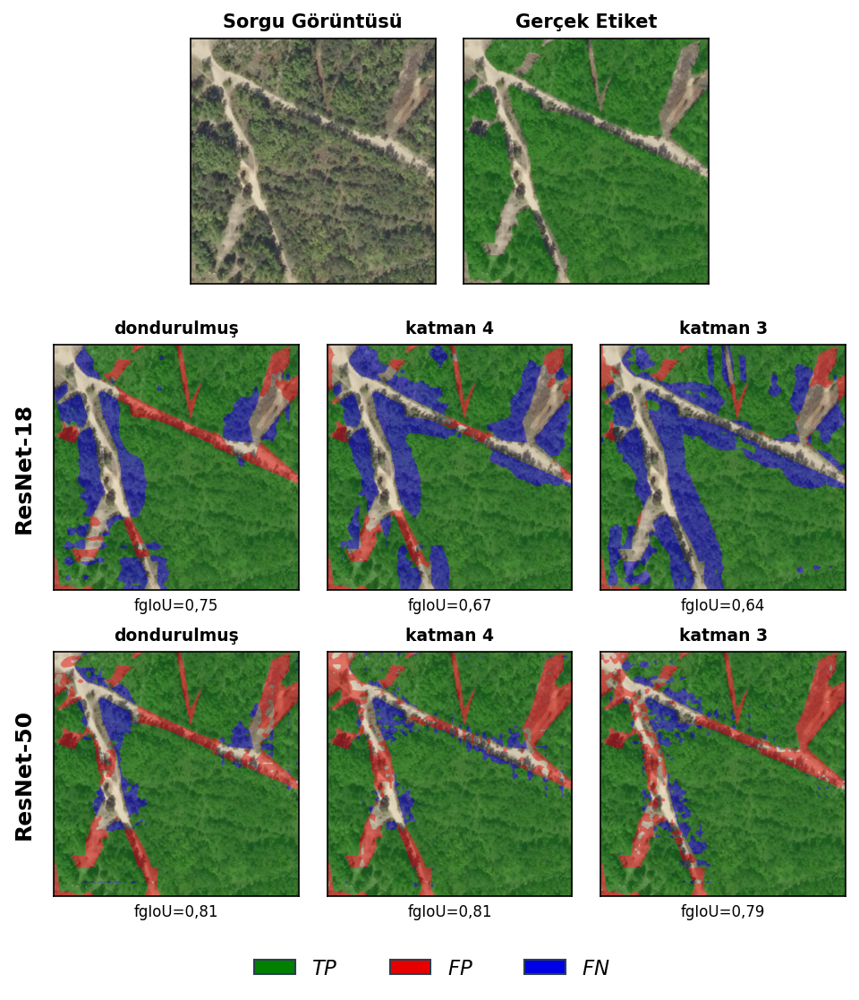

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp2_layer_unfreeze_orta.png


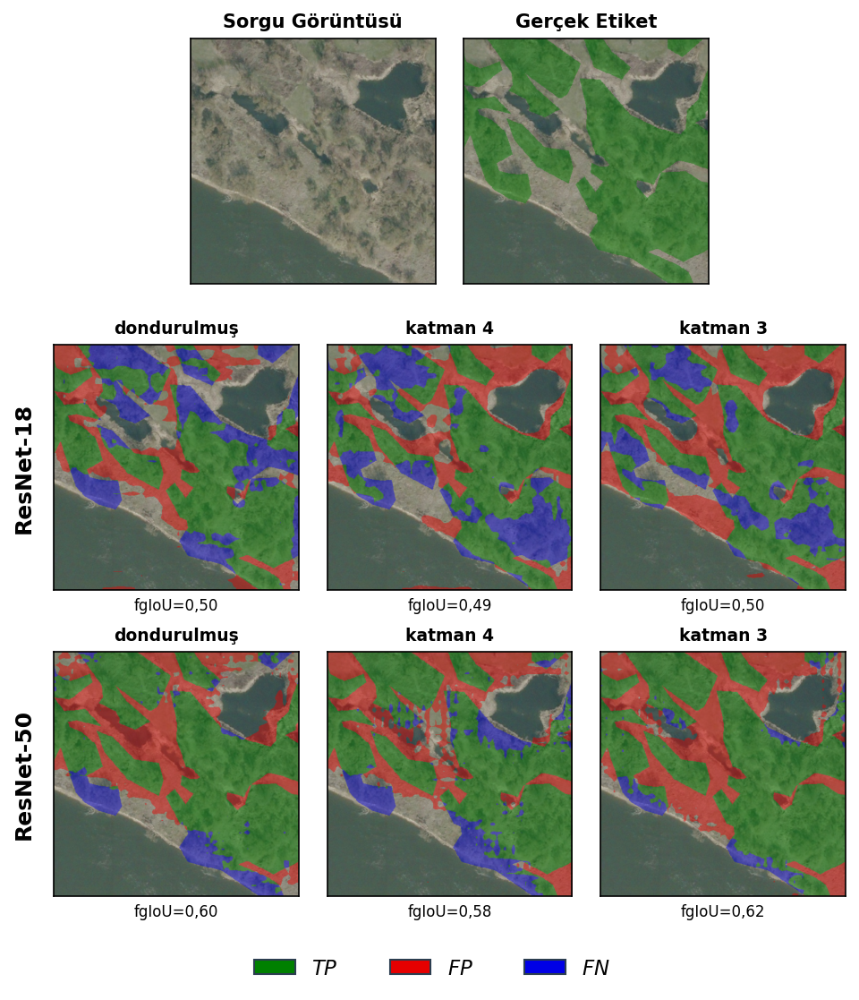

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp2_layer_unfreeze_zor.png


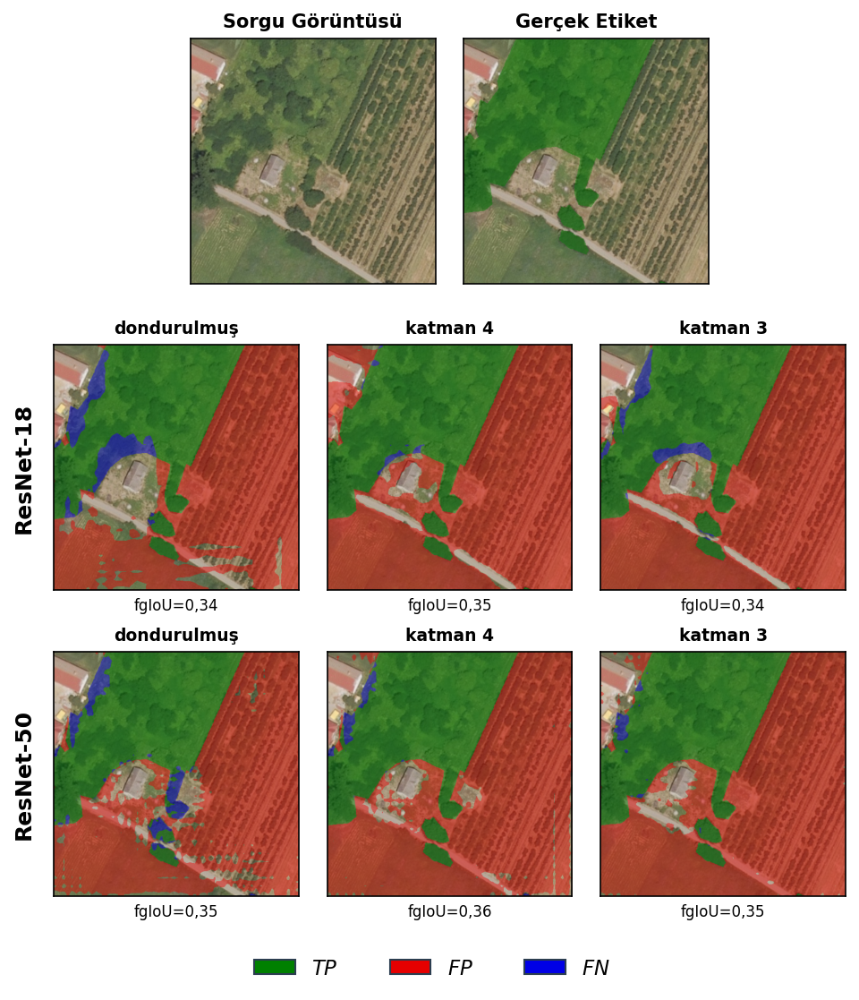

In [33]:
generate_thesis_experiment(
    model_keys=["ResNet-18", "R18-layer4", "R18-layer3",
                "ResNet-50", "R50-layer4", "R50-layer3"],
    display_labels=["dondurulmuş", "katman 4", "katman 3",
                    "dondurulmuş", "katman 4", "katman 3"],
    cols=3,
    model_row_labels=[
        (0, "ResNet-18"),  # ilk model satırı (gs row 1)
        (1, "ResNet-50"),  # ikinci model satırı (gs row 2)
    ],
    save_name="exp2_layer_unfreeze",
)


#### Tez Görsel 3 — Aşama Açma (Swin-T)

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp3_stage_unfreeze_kolay.png


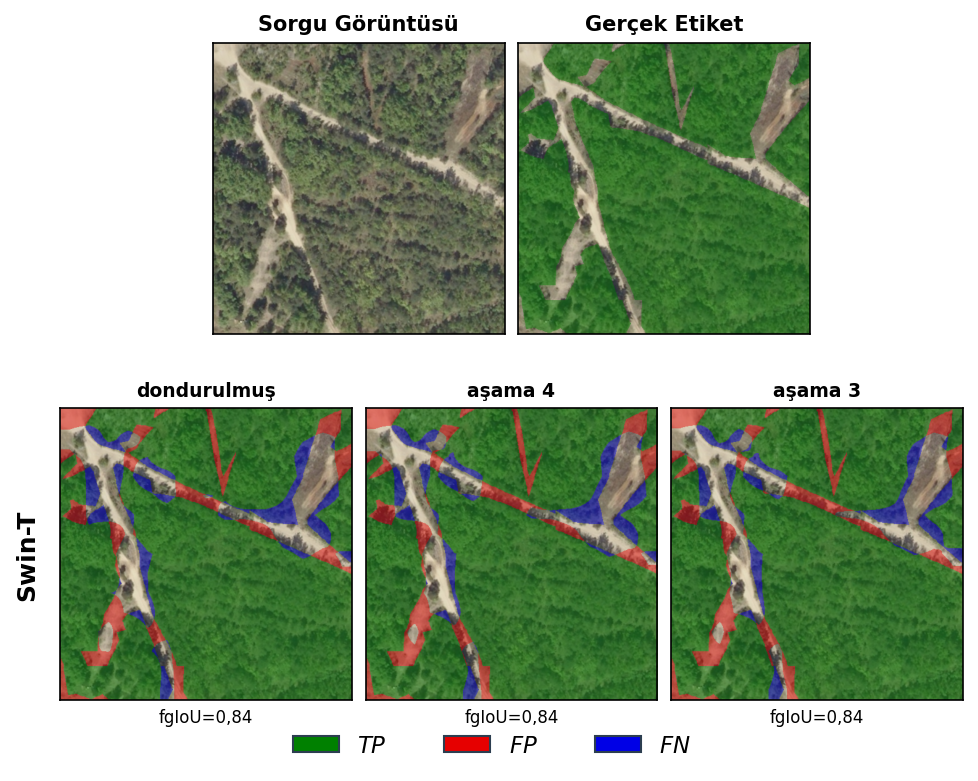

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp3_stage_unfreeze_orta.png


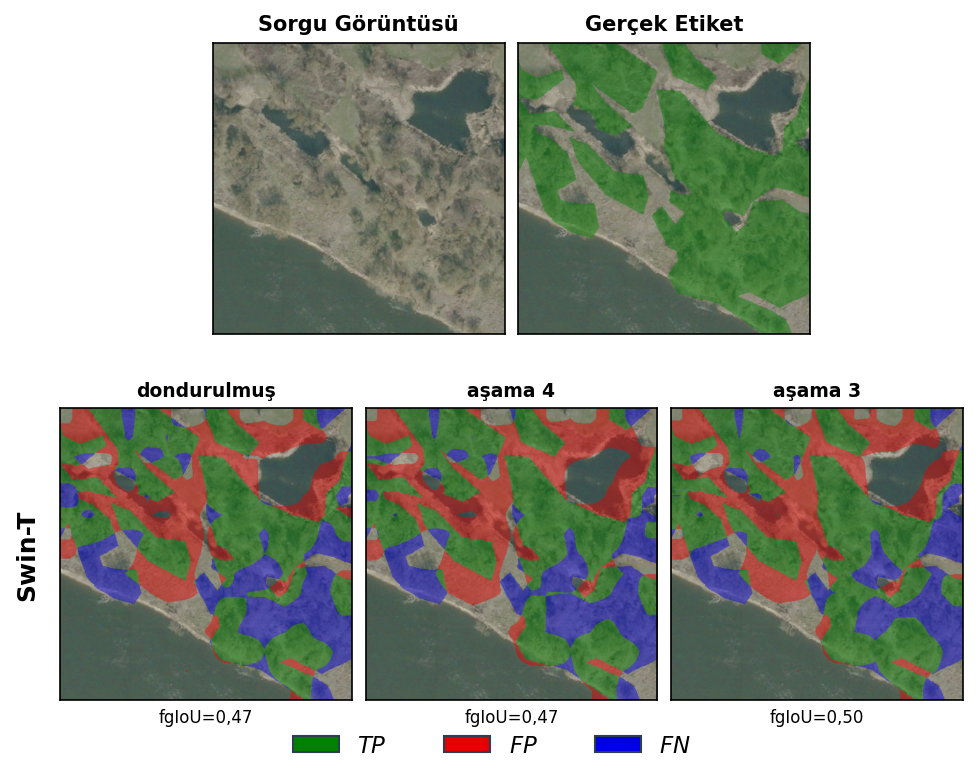

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp3_stage_unfreeze_zor.png


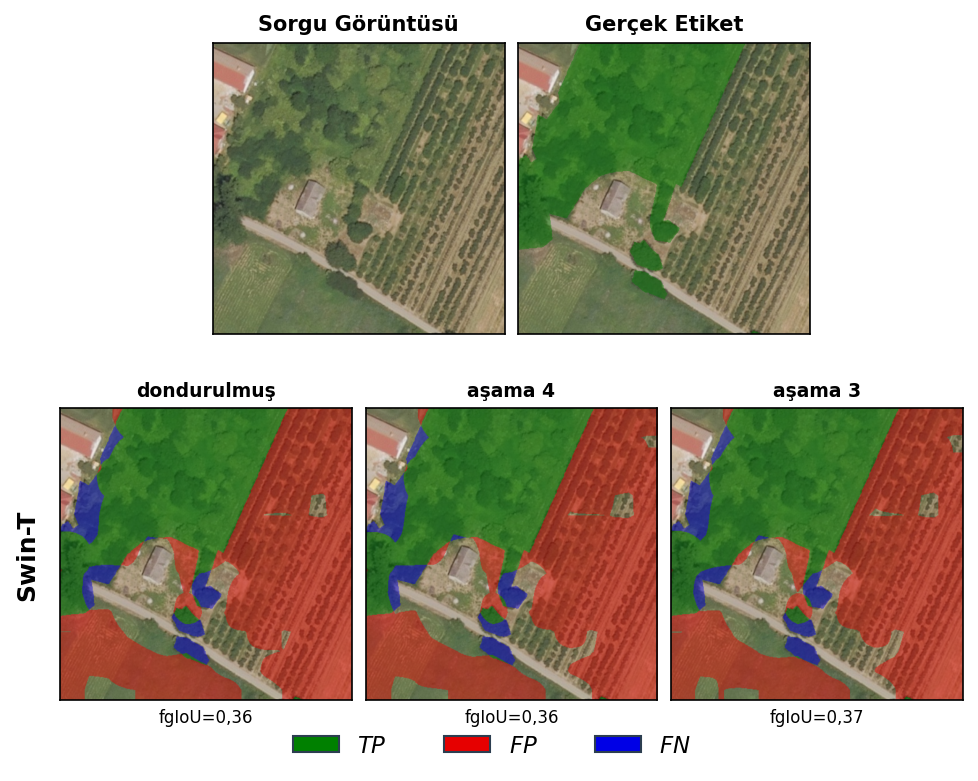

In [37]:
generate_thesis_experiment(
    model_keys=["Swin-T", "Swin-T stage4", "Swin-T stage3"],
    display_labels=["dondurulmuş", "aşama 4", "aşama 3"],
    cols=3,
    model_row_labels=[(0, "Swin-T")],  # tek satır, sol kenarda etiket
    save_name="exp3_stage_unfreeze",
)


#### Tez Görsel 4 — Ön Eğitimli Ağırlık Karşılaştırması (5 kaynak)

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp4_pretrained_kolay.png


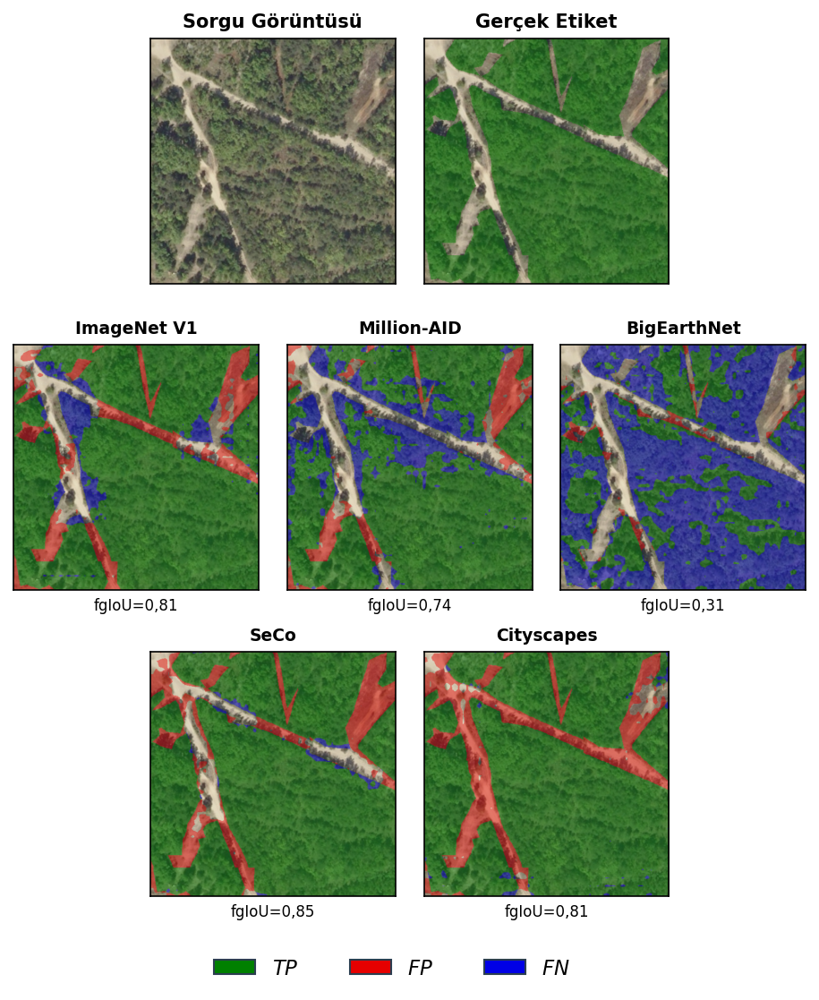

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp4_pretrained_orta.png


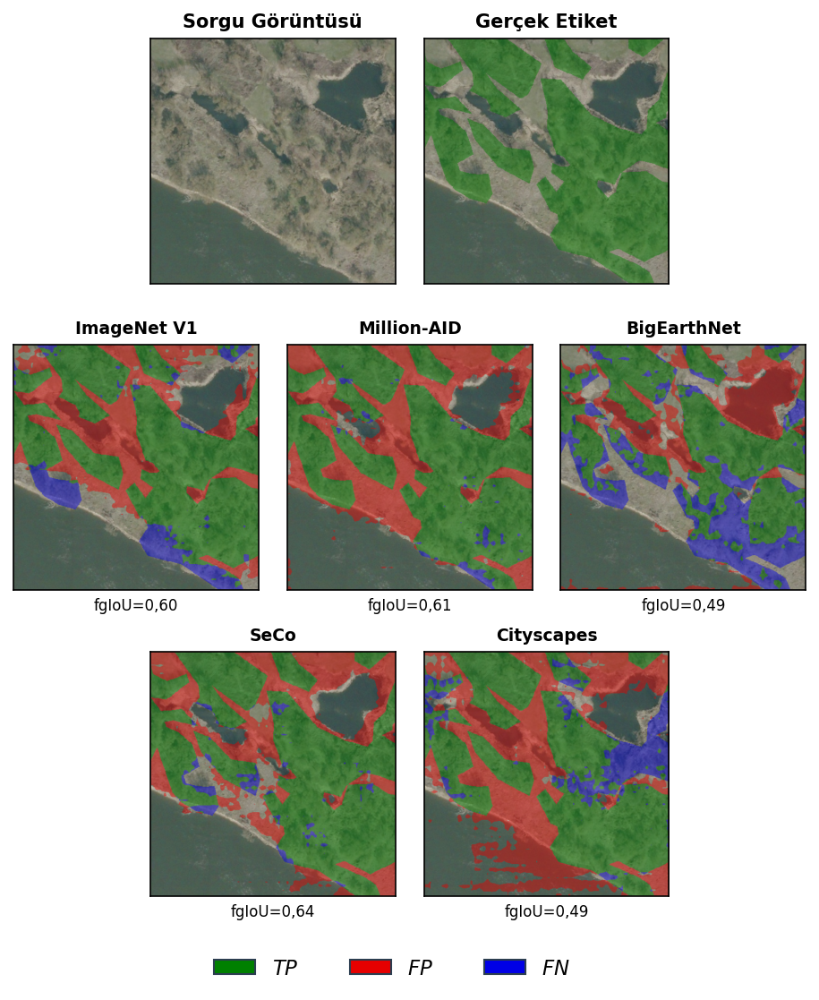

Kaydedildi: /home/zehra/Desktop/woodland/figures/qualitative_results/exp4_pretrained_zor.png


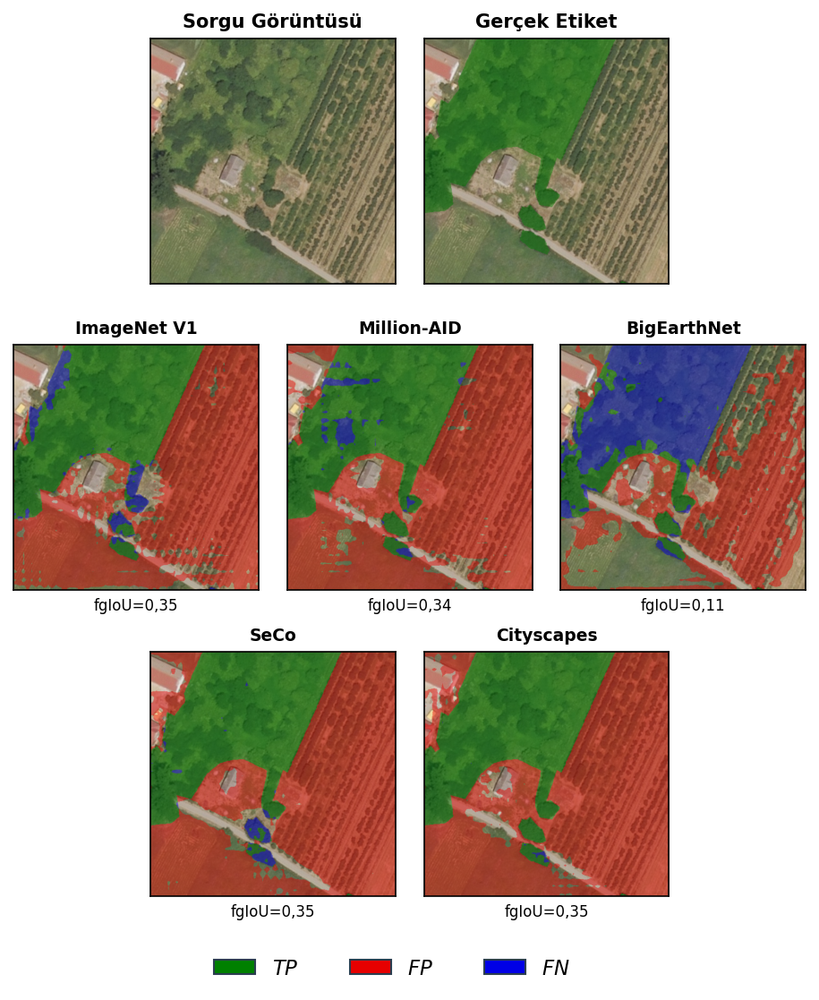

In [36]:
generate_thesis_experiment(
    model_keys=["ResNet-50", "Million-AID", "BigEarthNet", "SeCo", "Cityscapes"],
    display_labels=["ImageNet V1", "Million-AID", "BigEarthNet", "SeCo", "Cityscapes"],
    cols=3,  # 5 model → 2 satır (3+2), her satır kendi içinde ortalanır
    save_name="exp4_pretrained",
)
